# DataLoader Example

## 1. Pytorch-geometric dataloader

In [1]:
import os
import sys
srcdir = os.path.join(
    os.getcwd().split('source')[0],
    'source'
)
ptd = os.path.join(srcdir, 'pytorch_dataset')
sys.path.append(ptd)

import torch
import numpy as np
import pandas as pd
import scipy
import argparse
import networkx as nx
import torch_geometric.transforms as T
from link_dataset import LinkVesselGraph
from node_dataset import NodeVesselGraph
from vessap_utils import *

# for multi-class labeling
from sklearn.preprocessing import KBinsDiscretizer
import matplotlib.pyplot as plt

### 1.1 Link Dataloader

In [116]:
# dataset = 'CD1-E_no2'
dataset = 'BALBc_no1'
splitting_strategy = 'random'

link_dataset = LinkVesselGraph(root='data', 
                          name=dataset,
                          splitting_strategy=splitting_strategy,
                          number_of_workers = 2,
                          val_ratio = 0.1,
                          test_ratio = 0.1,
                          seed=123,
                          )

Available Datasets are: dict_keys(['synthetic_graph_1', 'synthetic_graph_2', 'synthetic_graph_3', 'synthetic_graph_4', 'synthetic_graph_5', 'BALBc_no1', 'BALBc_no2', 'BALBc_no3', 'C57BL_6_no1', 'C57BL_6_no2', 'C57BL_6_no3', 'CD1-E_no1', 'CD1-E_no2', 'CD1-E_no3', 'C57BL_6-K18', 'C57BL_6-K19', 'C57BL_6-K20', 'link_vessap_roi1', 'link_vessap_roi3'])


Extracting data/BALBc_no1/raw/BALBc_no1.zip
Processing...


data/BALBc_no1/raw/BALBc_no1/BALBc-no1_iso3um_stitched_segmentation_bulge_size_3.0/BALBc-no1_iso3um_stitched_segmentation_bulge_size_3.0_nodes_processed.csv
data/BALBc_no1/raw/BALBc_no1/BALBc-no1_iso3um_stitched_segmentation_bulge_size_3.0/BALBc-no1_iso3um_stitched_segmentation_bulge_size_3.0_edges_processed.csv


Done!


In [117]:
data = link_dataset[0]
print(f'Dataset: {link_dataset}:')
print('======================')
print(f'Number of graphs: {len(link_dataset)}')
print(f'Number of features: {link_dataset.num_features}')
print(f'Number of nodes: {data.num_nodes}')
print(f'Number of edges: {data.num_edges}')
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}')
print(f'Contains isolated nodes: {data.contains_isolated_nodes()}')
print(f'Contains self-loops: {data.contains_self_loops()}')
print(f'Is directed: {data.is_directed()}')

Dataset: LinkVesselGraph():
Number of graphs: 1
Number of features: 5
Number of nodes: 3538495
Number of edges: 8553438
Average node degree: 2.42


/Users/gregcondit/miniconda3/envs/vesselgraph/lib/python3.10/site-packages/torch_geometric/deprecation.py:22: UserWarning:

'contains_isolated_nodes' is deprecated, use 'has_isolated_nodes' instead



Contains isolated nodes: True
Contains self-loops: False


/Users/gregcondit/miniconda3/envs/vesselgraph/lib/python3.10/site-packages/torch_geometric/deprecation.py:22: UserWarning:

'contains_self_loops' is deprecated, use 'has_self_loops' instead



Is directed: False


### 1.2 Node Dataloader

In [118]:
node_dataset = NodeVesselGraph(root='data', name=dataset, pre_transform=T.LineGraph(force_directed=False))

data = node_dataset[0]
print(f'Dataset: {node_dataset}:')
print('======================')
print(f'Number of graphs: {len(node_dataset)}')
print(f'Number of features: {node_dataset.num_features}')
print(f'Number of nodes: {data.num_nodes}')
print(f'Number of edges: {data.num_edges}')
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}')
print(f'Contains isolated nodes: {data.contains_isolated_nodes()}')
print(f'Contains self-loops: {data.contains_self_loops()}')
print(f'Is directed: {data.is_directed()}')

/Users/gregcondit/miniconda3/envs/vesselgraph/lib/python3.10/site-packages/torch_geometric/data/dataset.py:209: UserWarning:

The `pre_transform` argument differs from the one used in the pre-processed version of this dataset. If you want to make use of another pre-processing technique, make sure to delete 'data/BALBc_no1/processed' first



Dataset: NodeVesselGraph():
Number of graphs: 1
Number of features: 5
Number of nodes: 3538495
Number of edges: 8553438
Average node degree: 2.42
Contains isolated nodes: True
Contains self-loops: False
Is directed: False


In [119]:
data.node_stores[0]['node_attr_keys']

['pos_x', 'pos_y', 'pos_z', 'degree', 'isAtSampleBorder']

## 2. OGB dataloader

In [7]:
# from source.ogb.io import DatasetSaver
# from source.ogb.linkproppred import LinkPropPredDataset

In [8]:
# dataset_name = 'ogbl-' + dataset + '_' + splitting_strategy # e.g. ogbl-BALBc_no1_spatial
# dataset_name +=  '_no_edge_attr' 

# saver = DatasetSaver(dataset_name = dataset_name,
#                     is_hetero = False,
#                     version = 1)

# # another example:
# dataset_name = 'ogbn-' + dataset # e.g. ogbl-italo

In [9]:
# import igraph as ig


In [10]:
len(data.node_stores)

1

In [11]:
print(data.node_stores[0]['node_attr_keys'])
print(data.node_stores[0]['x'][0])

['pos_x', 'pos_y', 'pos_z', 'degree', 'isAtSampleBorder']
tensor([1.3640e+03, 1.9080e+03, 7.4000e+01, 1.0000e+00, 0.0000e+00],
       dtype=torch.float64)


In [12]:
data.x[0]

tensor([1.3640e+03, 1.9080e+03, 7.4000e+01, 1.0000e+00, 0.0000e+00],
       dtype=torch.float64)

In [13]:
# [k for k,v in data.node_stores[0].items()]

In [14]:
# nodeids = [i for i, x in enumerate(data.node_stores[0]['x']) if x[3] > 2]
# len(nodeids)

In [15]:
data.edge_index

tensor([[      0,       2,       5,  ..., 1664810, 1664810, 1664810],
        [ 413818,  413823,  413852,  ..., 1664776, 1664802, 1664806]])

In [16]:
data.node_stores[0]['edge_attr_keys']

['length', 'distance', 'avgRadiusAvg', 'roundnessAvg', 'curveness']

In [17]:
data.node_stores[0]['edge_attr_undirected'].shape

torch.Size([4300652, 5])

In [120]:
Edges = [(int(data.edge_index[0][i]), int(data.edge_index[1][i])) for i in range(data.edge_index.shape[1])]
len(Edges)

8553438

In [121]:
# G=ig.Graph(Edges, directed=False)

In [122]:
coords = [[int(x) for x in data.node_stores[0]['x'][i][:3]] for i in range(data.num_nodes)]
len(coords)

3538495

In [123]:
set([len(x) for x in coords])

{3}

In [124]:
coords[0]

[2932, 3477, 0]

In [125]:
Xn, Yn, Zn = zip(*coords)

In [126]:
len(Xn), len(Yn), len(Zn)

(3538495, 3538495, 3538495)

In [127]:
Edges[0]

(0, 278560)

In [128]:
Xe=[]
Ye=[]
Ze=[]
for e in Edges:
    Xe+=[coords[e[0]][0],coords[e[1]][0], None]# x-coordinates of edge ends
    Ye+=[coords[e[0]][1],coords[e[1]][1], None]  
    Ze+=[coords[e[0]][2],coords[e[1]][2], None]

In [129]:
import chart_studio.plotly as py
import plotly.graph_objs as go

In [ ]:
# trace1=go.Scatter3d(x=Xe,
#                y=Ye,
#                z=Ze,
#                mode='lines',
#                line=dict(color='rgb(125,125,125)', width=3),
#                hoverinfo='none'
#                )

# trace2=go.Scatter3d(x=Xn,
#                y=Yn,
#                z=Zn,
#                mode='markers',
#                name='actors',
#                marker=dict(symbol='circle',
#                              size=1,
#                             #  color=group,
#                             #  colorscale='Viridis',
#                              line=dict(color='rgb(50,50,50)', width=0.5)
#                              ),
#             #    text=labels,
#             #    hoverinfo='text'
#                )

# axis=dict(showbackground=False,
#           showline=False,
#           zeroline=False,
#           showgrid=False,
#           showticklabels=False,
#           title=''
#           )

# layout = go.Layout(
#          title="Network of coappearances of characters in Victor Hugo's novel<br> Les Miserables (3D visualization)",
#          width=1000,
#          height=1000,
#          showlegend=False,
#          scene=dict(
#              xaxis=dict(axis),
#              yaxis=dict(axis),
#              zaxis=dict(axis),
#         ),
#      margin=dict(
#         t=100
#     ),
#     hovermode='closest',
#     annotations=[
#            dict(
#            showarrow=False,
#             text="Data source: <a href='http://bost.ocks.org/mike/miserables/miserables.json'>[1] miserables.json</a>",
#             xref='paper',
#             yref='paper',
#             x=0,
#             y=0.1,
#             xanchor='left',
#             yanchor='bottom',
#             font=dict(
#             size=14
#             )
#             )
#         ],    )

In [ ]:
### FAILS


# data=[trace1, trace2]
# fig=go.Figure(data=data, layout=layout)

# fig.show()

In [131]:
[k for k,v in data.node_stores[0].items()]

['node_attr_keys',
 'x',
 'pos',
 'edge_attr_keys',
 'edge_index_undirected',
 'edge_attr_undirected',
 'val_pos_edge_index',
 'val_pos_edge_attr',
 'test_pos_edge_index',
 'test_pos_edge_attr',
 'train_pos_edge_index',
 'edge_index',
 'edge_attr',
 'train_pos_edge_attr',
 'val_neg_edge_index',
 'test_neg_edge_index',
 'train_neg_edge_index']

In [132]:
print(data.node_stores[0]['edge_attr_keys'])
radii = data.node_stores[0]['edge_attr_undirected'][:,2]

['length', 'distance', 'avgRadiusAvg', 'roundnessAvg', 'curveness']


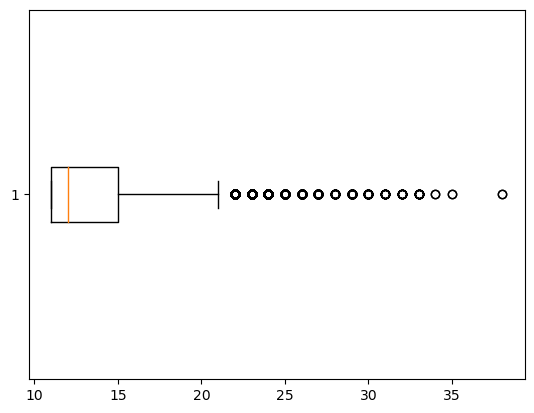

In [133]:
#horizontal 
plt.boxplot([x for x in radii if x>10], vert=False)
plt.show()

In [134]:
over5 = [x for x in radii if x>5]
len(over5)


312942

In [135]:
n=7
len([x for x in over5 if x > n])

94418

In [ ]:
# To create a viz of only the major vessels, we use radius as a proxy for 'majorness' and therefore filter out the smaller vessels (radius < 13)

In [ ]:
Edges = []
node_ids = set()
for i in range(data.edge_index.shape[1]):
    if data.edge_attr[i][2] > n:
        node_ids.add(int(data.edge_index[0][i]))
        node_ids.add(int(data.edge_index[1][i]))
        Edges.append((int(data.edge_index[0][i]), int(data.edge_index[1][i])))

In [ ]:
len(Edges), len(node_ids)

(63984, 45265)

In [ ]:
coords = {
    i: [int(x) for x in data.node_stores[0]['x'][i][:3]]
    for i in node_ids
}


len(coords.values()), set([len(x) for x in coords.values()])

(45265, {3})

In [ ]:
coords[786432]

[1830, 1723, 719]

In [ ]:
Xn, Yn, Zn = zip(*coords.values())
len(Xn), len(Yn), len(Zn)

(45265, 45265, 45265)

In [ ]:
Xe=[]
Ye=[]
Ze=[]
for n1, n2 in Edges:
    Xe+=coords[n1][0],coords[n2][0], None # x-coordinates of edge ends
    Ye+=coords[n1][1],coords[n2][1], None
    Ze+=coords[n1][2],coords[n2][2], None

In [ ]:
import plotly.graph_objs as go

In [ ]:
# trace1=go.Scatter3d(x=Xe,
#                y=Ye,
#                z=Ze,
#                mode='lines',
#                line=dict(color='rgb(125,125,125)', width=2),
#                hoverinfo='none'
#                )


# trace2=go.Scatter3d(x=Xn,
#                y=Yn,
#                z=Zn,
#                mode='markers',
#                name='actors',
#                marker=dict(symbol='circle',
#                              size=.5,
#                             #  color=group,
#                             #  colorscale='Viridis',
#                              line=dict(color='rgb(50,50,50)', width=0.5)
#                              ),
#             #    text=labels,
#             #    hoverinfo='text'
#                )

# axis=dict(showbackground=False,
#           showline=False,
#           zeroline=False,
#           showgrid=False,
#           showticklabels=False,
#           title=''
#           )

# layout = go.Layout(
#          title="Network of coappearances of characters in Victor Hugo's novel<br> Les Miserables (3D visualization)",
#          width=1000,
#          height=1000,
#          showlegend=False,
#          scene=dict(
#              xaxis=dict(axis),
#              yaxis=dict(axis),
#              zaxis=dict(axis),
#         ),
#      margin=dict(
#         t=100
#     ),
#     hovermode='closest',
#     annotations=[
#            dict(
#            showarrow=False,
#             text="Data source: <a href='http://bost.ocks.org/mike/miserables/miserables.json'>[1] miserables.json</a>",
#             xref='paper',
#             yref='paper',
#             x=0,
#             y=0.1,
#             xanchor='left',
#             yanchor='bottom',
#             font=dict(
#             size=14
#             )
#             )
#         ],    )

In [ ]:
# chartdata=[trace1, trace2]
# fig=go.Figure(data=chartdata, layout=layout)

# fig.show()

In [ ]:
## NExt, I want to try coloring and changing thickness of the lines based on the radius of the vessels
# I won't do this continuously, but rather in discrete steps

In [136]:
n=7

In [137]:
edges_small = []
edges_med = []
edges_large = []
node_ids = set()
for i in range(data.edge_index.shape[1]):
    if data.edge_attr[i][2] > n:
        node_ids.add(int(data.edge_index[0][i]))
        node_ids.add(int(data.edge_index[1][i]))
        if data.edge_attr[i][2] > 10:
            edges_large.append((int(data.edge_index[0][i]), int(data.edge_index[1][i])))
        elif data.edge_attr[i][2] > 8:
            edges_med.append((int(data.edge_index[0][i]), int(data.edge_index[1][i])))
        else:
            edges_small.append((int(data.edge_index[0][i]), int(data.edge_index[1][i])))
        

In [138]:
len(edges_small) + len(edges_med) + len(edges_large), len(node_ids)

(129428, 92257)

In [139]:
coords = {
    i: [int(x) for x in data.node_stores[0]['x'][i][:3]]
    for i in node_ids
}


len(coords.values()), set([len(x) for x in coords.values()])

(92257, {3})

In [140]:
Xn, Yn, Zn = zip(*coords.values())
len(Xn), len(Yn), len(Zn)

(92257, 92257, 92257)

In [141]:
Xe_small=[]
Ye_small=[]
Ze_small=[]
for n1, n2 in edges_small:
    Xe_small+=coords[n1][0],coords[n2][0], None # x-coordinates of edge ends
    Ye_small+=coords[n1][1],coords[n2][1], None
    Ze_small+=coords[n1][2],coords[n2][2], None

Xe_med=[]
Ye_med=[]
Ze_med=[]
for n1, n2 in edges_med:
    Xe_med+=coords[n1][0],coords[n2][0], None # x-coordinates of edge ends
    Ye_med+=coords[n1][1],coords[n2][1], None
    Ze_med+=coords[n1][2],coords[n2][2], None

Xe_large=[]
Ye_large=[]
Ze_large=[]
for n1, n2 in edges_large:
    Xe_large+=coords[n1][0],coords[n2][0], None # x-coordinates of edge ends
    Ye_large+=coords[n1][1],coords[n2][1], None
    Ze_large+=coords[n1][2],coords[n2][2], None



In [142]:
trace1=go.Scatter3d(x=Xe_small,
               y=Ye_small,
               z=Ze_small,
               mode='lines',
               line=dict(color='#EF8181', width=2),
               hoverinfo='none'
               )

trace2=go.Scatter3d(x=Xe_med,
                y=Ye_med,
                z=Ze_med,
                mode='lines',
                line=dict(color='#EA5D5D', width=3),
                hoverinfo='none'
                )

trace3=go.Scatter3d(x=Xe_large,
                y=Ye_large,
                z=Ze_large,
                mode='lines',
                line=dict(color='#C71A1A', width=4),
                hoverinfo='none'
                )

# trace4=go.Scatter3d(x=Xn,
#                y=Yn,
#                z=Zn,
#                mode='markers',
#                name='actors',
#                marker=dict(symbol='circle',
#                              size=.5,
#                             #  color=group,
#                             #  colorscale='Viridis',
#                              line=dict(color='rgb(50,50,50)', width=0.5)
#                              ),
#             #    text=labels,
#             #    hoverinfo='text'
#                )

axis=dict(showbackground=False,
          showline=False,
          zeroline=False,
          showgrid=False,
          showticklabels=False,
          title=''
          )

layout = go.Layout(
         title="Vessel Network for a CD-1 Lab Mouse (largest vessels only)",
         width=1000,
         height=1000,
         showlegend=False,
         scene=dict(
             xaxis=dict(axis),
             yaxis=dict(axis),
             zaxis=dict(axis),
        ),
     margin=dict(
        t=100
    ),
    hovermode='closest',
    # annotations=[
    #        dict(
    #        showarrow=False,
    #         text="Data source: <a href='http://bost.ocks.org/mike/miserables/miserables.json'>[1] miserables.json</a>",
    #         xref='paper',
    #         yref='paper',
    #         x=0,
    #         y=0.1,
    #         xanchor='left',
    #         yanchor='bottom',
    #         font=dict(
    #         size=14
    #         )
    #         )
    #     ],
    )


In [143]:
chartdata=[trace1, trace2, trace3, 
        #    trace4
        ]
fig=go.Figure(data=chartdata, layout=layout)

fig.show()

## trying to find atlas features

In [145]:
type(data)

torch_geometric.data.data.Data

In [149]:
data

Data(node_attr_keys=[5], x=[3538495, 5], pos=[3538495, 3], edge_attr_keys=[5], edge_index_undirected=[2, 10691794], edge_attr_undirected=[10691794, 5], val_pos_edge_index=[2, 534589], val_pos_edge_attr=[534589, 5], test_pos_edge_index=[2, 534589], test_pos_edge_attr=[534589, 5], train_pos_edge_index=[2, 4276719], edge_index=[2, 8553438], edge_attr=[8553438, 5], train_pos_edge_attr=[4276719, 5], val_neg_edge_index=[2, 534589], test_neg_edge_index=[2, 534589], train_neg_edge_index=[2, 4276719])